# COLMAP

A simple notebook using COLMAP + OpenCV for estimating camera poses and intrinsics 

In [1]:
import os
from pathlib import Path
import shutil
import urllib.request
import cv2
import pycolmap
import numpy as np
import torch
import torchvision.transforms.functional as F
from torchcodec.decoders import VideoDecoder

import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

In [2]:
video = VideoDecoder('video.mp4')

In [3]:
# This finds the transitions in the video
last_frame = video[0] / 255.0
error = []
for f in video:
    f = f / 255.0
    error.append(((f - last_frame) ** 2).mean()) # mse
    last_frame = f
error = torch.stack(error)


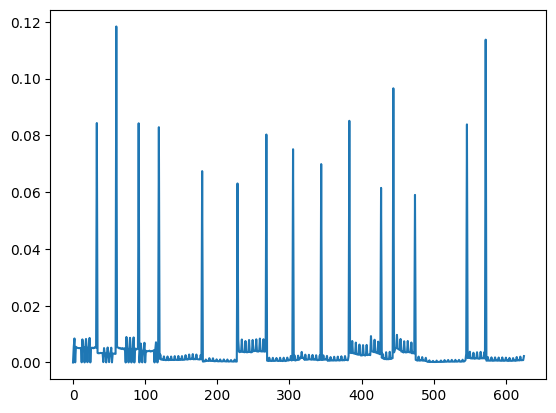

In [5]:
plt.plot(error.detach().cpu().numpy())

In [6]:
# Gets where the transitions occur (basically new scenes)
frame_transitions = torch.where(error > 0.03)[0]
frame_transitions


tensor([ 33,  60,  91, 119, 179, 228, 268, 305, 344, 383, 427, 444, 474, 546,
        572])

In [7]:
def display_video(frames, is_grayscale=False):
    h, w = frames.shape[-2:]
    scale = 512 / max(h, w)
    h, w = [int(i * scale) for i in (h, w)]

    frames = F.resize(frames, (h, w))
    frames = frames.permute(0, 2, 3, 1).cpu().numpy()
    
    fig = plt.figure(
        figsize=(w / 100, h / 100),
        dpi=100,
        frameon=False
    )
    
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    
    im = ax.imshow(
        frames[0],
        cmap='gray' if is_grayscale else None,
        aspect="equal"
    )

    def update(frame_idx):
        im.set_data(frames[frame_idx])
        return [im]

    anim = animation.FuncAnimation(
        fig, update, frames=len(frames), interval=50, blit=True
    )
    plt.close()
    return HTML(anim.to_jshtml())

In [8]:
video_index = 12
frames = video[frame_transitions[video_index]:frame_transitions[video_index + 1]]
frames_np = frames.permute(0, 2, 3, 1).cpu().numpy()
display_video(frames)

In [9]:
# frames_gray = F.rgb_to_grayscale(frames, num_output_channels=1)
# frames_gray_np = frames_gray.permute(0, 2, 3, 1).cpu().numpy()
# display_video(frames_gray, is_grayscale=True)

In [10]:
def get_c2ws(maps):
    images = sorted([r for m in maps.values() for r in m.images.values()], key=lambda i: i.name)
    w2cs = []
    for image in images:
        R = image.cam_from_world().rotation.matrix()
        t = image.cam_from_world().translation

        w2c = np.eye(4)
        w2c[:3, :3], w2c[:3, 3] = R, t
        w2cs.append(w2c)
    c2ws = np.linalg.inv(np.stack(w2cs))

    return c2ws


def run_sfm(frames):
    path = Path('colmap')
    image_dir = path / 'frames'
    output_path = path / 'reconstruction'
    database_path = path / 'database.db'
    
    shutil.rmtree(path, ignore_errors=True)
    os.makedirs(image_dir, exist_ok=True)
    for i, img in enumerate(frames):
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        cv2.imwrite(str(image_dir / f'{i:05d}.png'), img)

    # feature extraction
    pycolmap.extract_features(
        database_path=database_path,
        image_path=image_dir
    )

    # feature matching
    pycolmap.match_exhaustive(database_path)

    # incremental SfM
    maps = pycolmap.incremental_mapping(
        database_path=database_path,
        image_path=image_dir,
        output_path=output_path
    )
    
    shutil.rmtree(path, ignore_errors=True)

    return maps

In [ ]:
maps = run_sfm(frames_np)
c2ws = get_c2ws(maps)

I20260520 19:36:41.381020 128062601414336 feature_extraction.cc:506] === Feature extraction ===
I20260520 19:36:41.381602 128062117074624 sift.cc:757] Creating SIFT GPU feature extractor
I20260520 19:36:41.578165 128062108681920 feature_extraction.cc:284] Processed file [1/72]
I20260520 19:36:41.578189 128062108681920 feature_extraction.cc:287]   Name:            00000.png
I20260520 19:36:41.578192 128062108681920 feature_extraction.cc:296]   Dimensions:      1920 x 1080
I20260520 19:36:41.578194 128062108681920 feature_extraction.cc:299]   Camera:          #1 - SIMPLE_RADIAL
I20260520 19:36:41.578197 128062108681920 feature_extraction.cc:302]   Focal Length:    2304.00px
I20260520 19:36:41.578206 128062108681920 feature_extraction.cc:306]   Features:        3872 (SIFT)
I20260520 19:36:41.612664 128062108681920 feature_extraction.cc:284] Processed file [2/72]
I20260520 19:36:41.612686 128062108681920 feature_extraction.cc:287]   Name:            00001.png
I20260520 19:36:41.612690 1280

In [ ]:
print(c2ws[:3, :3, :3])

[[[ 0.98802666 -0.00984302 -0.15396896]
  [-0.00404651  0.99596625 -0.08963739]
  [ 0.15423019  0.08918717  0.98400137]]

 [[ 0.98852881 -0.00967755 -0.15072205]
  [-0.00358404  0.99616091 -0.08746774]
  [ 0.15098989  0.08700457  0.98469907]]

 [[ 0.98905253 -0.00982071 -0.14723672]
  [-0.00292898  0.99627984 -0.08612727]
  [ 0.14753481  0.08561564  0.98534433]]]


In [ ]:
def plot_trajs(c2ws, arrow_length=0.5):
    R, t = c2ws[..., :3, :3], c2ws[..., :3, 3]
    o, d = t, R[..., 2] # Z axis

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    ax.plot(o[:, 0], o[:, 1], o[:, 2], color='blue', linestyle='--', marker='o', label='Trajectory')

    ax.quiver(
        o[:, 0], o[:, 1], o[:, 2],
        d[:, 0], d[:, 1], d[:, 2],
        length=arrow_length, color='red', normalize=True, label='Forward vector'
    )

    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.set_title('Camera trajectories')
    ax.legend()
    ax.set_box_aspect([1, 1, 1])

    plt.show()

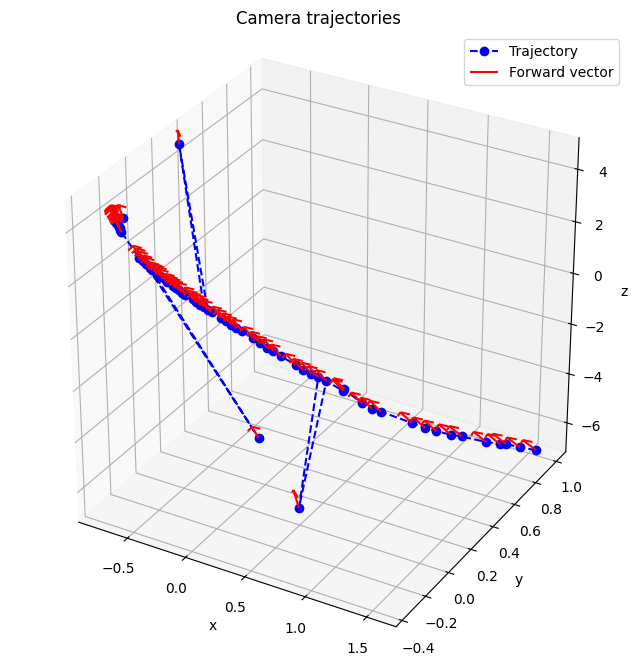

In [ ]:
plot_trajs(c2ws)